In [1]:
# import 
import os
import re
import csv
import copy
import time
import math
from math import sqrt, acos, atan2, sin, cos
import datetime
import statistics

from numpy import dot
from numpy.linalg import norm
import numpy as np
import pandas as pd
from pandas import ExcelWriter 
from glob import glob
from collections import defaultdict


import scipy
import pickle
import pymannkendall as mk
%matplotlib inline
import matplotlib.pyplot as plt 
import seaborn as sns
import missingno as msno
%load_ext line_profiler

from src.utils import (
    time2frame, metadata2frame, coughxlsx2df, processed2df, cut2case, cut2single, 
    _make_query, make_queries, query, query_w, getqueries, tval_df, bubbles2e, openpkl,
    createFolder, data2csv, save2pkl
)

from src.utils_plot import(
    cutplot, draw_corr_pval, drawheatmap_ttest,
)

import Dataloader as dl

### Data Loader

In [2]:
date = 'pilot'
# datapath_top = f'./data/raw/{date}'
datapath_top = f'./{date}'
scenes = ["Practice", "Elvtest", "Outside", "Hallway", "Elevator", "Hall"]

(names, anxiety, unity) = dl.dataloader(datapath_top, scenes)

cansu


Stream 2: Calculated effective sampling rate 255.9834 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 255.9834 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 255.9841 Hz is different from specified rate 100.0000 Hz.
Stream 1: Calculated effective sampling rate 87.8917 Hz is different from specified rate 50.0000 Hz.
Stream 2: Calculated effective sampling rate 255.9841 Hz is different from specified rate 100.0000 Hz.
Stream 1: Calculated effective sampling rate 87.8917 Hz is different from specified rate 50.0000 Hz.


jinhee


Stream 2: Calculated effective sampling rate 256.0076 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 256.0076 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 88.6072 Hz is different from specified rate 50.0000 Hz.
Stream 1: Calculated effective sampling rate 256.0052 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 88.6072 Hz is different from specified rate 50.0000 Hz.
Stream 1: Calculated effective sampling rate 256.0052 Hz is different from specified rate 100.0000 Hz.


serin


Stream 1: Calculated effective sampling rate 88.9114 Hz is different from specified rate 50.0000 Hz.
Stream 2: Calculated effective sampling rate 256.0056 Hz is different from specified rate 100.0000 Hz.
Stream 1: Calculated effective sampling rate 88.9114 Hz is different from specified rate 50.0000 Hz.
Stream 2: Calculated effective sampling rate 256.0056 Hz is different from specified rate 100.0000 Hz.
Stream 1: Calculated effective sampling rate 256.0069 Hz is different from specified rate 100.0000 Hz.
Stream 1: Calculated effective sampling rate 256.0069 Hz is different from specified rate 100.0000 Hz.


### Anxiety Preprocessing

In [3]:
## Video Survey by Psychopy

scenes = ["Outside", "Hallway", "Elevator", "Hall"]
anxiety_psy = dl.Anxiety_preprocessing(anxiety['Psychopy'],scenes)
directory = f'./data/processed/Anxiety_psy'
data2csv(anxiety_psy, names, filename='Anxiety_psychopy',directory=directory)


In [32]:
anxiety_psy[0][]

,Time,marker,Scene,Subject
0,55.3362,2.9925925927236676,Outside,cansu
1,55.3362,2.9925925927236676,Outside,cansu
2,60.6529,2.9925925927236676,Outside,cansu
3,60.6761,2.9925925927236676,Outside,cansu
4,60.7019,2.9925925927236676,Outside,cansu
...,...,...,...,...
710,658.9939,0.7888889312744141,Hall,cansu
711,659.0106,1.0,Hall,cansu
712,688.1115,1.0,Hall,cansu
713,688.6936,1.0,Hall,cansu


In [35]:
anxiety_psy[1]['marker'] = pd.to_numeric(anxiety_psy[1]['marker'])

In [37]:
anxiety_psy[1]

,Time,marker,Scene,Subject
0,26.0363,2.288889,Outside,jinhee
1,26.0363,2.288889,Outside,jinhee
2,26.0862,2.288889,Outside,jinhee
3,26.1028,2.288889,Outside,jinhee
4,26.1196,2.288889,Outside,jinhee
...,...,...,...,...
42730,810.7744,3.207407,Hall,jinhee
42731,810.7910,3.207407,Hall,jinhee
42732,810.8077,3.207407,Hall,jinhee
42733,810.8244,3.207407,Hall,jinhee


In [4]:
## Physiological Data

### Transform Preprocessing

In [13]:
transforms = defaultdict(dict)
scenes = ["Outside", "Hallway", "Elevator", "Hall"]
for scene in scenes:
    ppls = len(unity["position"][scene])
    for ppl in range(ppls):
        df_p = unity["position"][scene][ppl].drop(["Subject"], axis=1)
        df_r = unity["rotation"][scene][ppl].drop(["Subject"], axis=1)
        transform = dl.playertransform(df_p, df_r)

In [5]:
transforms = defaultdict(dict)
scenes = ["Outside", "Hallway", "Elevator", "Hall"]
for scene in scenes:
    ppls = len(unity["position"][scene])
    for ppl in range(ppls):
        df_p = unity["position"][scene][ppl].drop(["Subject"], axis=1)
        df_r = unity["rotation"][scene][ppl].drop(["Subject"], axis=1)
        transform = dl.playertransform(df_p, df_r)
        dist = dl.distance_uclid(transform)
        name = names[ppl]
        # print(name)
        for idx in range(len(transform)):
            df = transform[idx]
            if df['SubjectID_1_pos'][0] == df['SubjectID_2_pos'][0]:
                df['case'] = 'participant'
            else:
                df['case'] = 'agent'    
            df = df.drop(columns=['SubjectID_1_pos', 'X_1_pos', 'Y_1_pos', 
                                'Z_1_pos', 'SubjectID_1_rot', 'X_1_rot', 'Y_1_rot', 'Z_1_rot',
                                'Y_2_pos', 'X_2_rot', 'Z_2_rot', 'SubjectID_2_rot','SubjectID_2_pos'])
            df['distance'] = dist[idx]
            df['name'] = name
            
            identifier = f"off_{scene}"
            # transform[idx] = df[df['distance']<7.6].reset_index(drop=True)
            transform[idx] = df
            zone_list = []
            for index in range(len(transform[idx])):
                _dist = transform[idx]['distance'][index]
                if (_dist <= 6.6) & (_dist > 3.6):
                    zone_list.append('public')
                elif (_dist <= 3.6) & (_dist > 1.2):
                    zone_list.append('social')
                elif (_dist <= 1.2) & (_dist > 0.45):
                    zone_list.append('personal')
                elif (_dist <= 0.45):
                    zone_list.append('intimate')
                else:
                    zone_list.append('outofreach')
            transform[idx]['zone'] = zone_list

            
        transform = [df for df in transform if not df.empty]
        transforms[identifier][name] = transform

directory = f'./data/processed/transform_all.pkl'
# directory = f'./data/processed/transform_{date}.pkl'

save2pkl(transforms, directory)      


### Animating Pathway

In [6]:
# plt.figure(figsize=(6,6))
# plt.title("Subject Trace")
# plt.ylim((-100,-10))
# plt.xlim((-20,80))
# for idx in range(len(transforms)):
#     df = transforms[idx]
#     if df['SubjectID_2_pos'][0] == df['SubjectID_1_pos'][0]:
#         sns.scatterplot(data=df, x='X_1_pos', y='Z_1_pos', s = 3, edgecolor='gray', color = 'black', alpha=0.5) #Anxiety colored path
#     else:
#         size = 20
#         alpha = 0.7
#         sns.scatterplot(data=df[df['zone']=='intimate'], x='X_2_pos', y='Z_2_pos', s = size, color = 'midnightblue', alpha=alpha, legend=False)
#         sns.scatterplot(data=df[df['zone']=='personal'], x='X_2_pos', y='Z_2_pos', s = size, color = 'royalblue', alpha=alpha, legend=False)
#         sns.scatterplot(data=df[df['zone']=='social'], x='X_2_pos', y='Z_2_pos', s = size, color = 'cornflowerblue', alpha=alpha, legend=False)
#         sns.scatterplot(data=df[df['zone']=='public'], x='X_2_pos', y='Z_2_pos', s = size, color = 'lightsteelblue', alpha=alpha, legend=False)
        
        
# # Agent dot color change by zone
# # Participant dot color change by Anxiety --> Additional data concat needed about anxiet

# Agent Intention Check

In [21]:

# intentions = []
# cintentions = []

# transforms = defaultdict(dict)
# scenes = ["Outside", "Hallway", "Elevator", "Hall"]
# for scene in scenes:
#     ppls = len(unity["position"][scene])
#     for ppl in range(ppls):
#         df_p = unity["position"][scene][ppl].drop(["Subject"], axis=1)
#         df_r = unity["rotation"][scene][ppl].drop(["Subject"], axis=1)
#         total = dl.agentcheck(df_p, df_r, names)
#         all_df = pd.DataFrame()
#         mask = names[0].split('_')[1]
#         name = names[0].split('_')[0]
#         for tidx in range(len(total)):
#             space = 'out'
#             totallen = cough[f'{mask}_{space}'][name][1]['Total_video_length']
#             lst = total
#             current = lst[idx][tidx][(lst[idx][tidx]['intention'] == 'direct toward' ) | (lst[idx][tidx]['intention'] == 'inside zone' )]
#             current = current[:totallen+1]
#             # current = total_in[idx][tidx]
#             all_df_out = pd.concat([all_df_out,current], axis=0)

#         all_df_out,  all_df_in= all_df_out.sort_values(by='Time', axis=0), all_df_in.sort_values(by='Time', axis=0) 
#         all_df_out,  all_df_in= all_df_out.reset_index(drop=True), all_df_in.reset_index(drop=True)
#         all_df_out['Time'] = all_df_out['Time'].apply(time2frame, textformet=False).astype('int')
#         all_df_in['Time'] = all_df_in['Time'].apply(time2frame, textformet=False).astype('int')
        
#         all_df_out['subject_ID'], all_df_in['subject_ID'] =  all_df_out['subject_ID'].astype('int'), all_df_in['subject_ID'].astype('int')
#         intentions.append(all_df_out)


In [ ]:
# directory=f'./data/processed/Intentions_{date}'
# data2csv(intentions, names, filename='intentions_',directory=directory)


### Bubble

In [22]:
bubble, bubble_360 = [], []
scenes = ["Outside", "Hallway", "Elevator", "Hall"]
for scene in scenes:
    ppls = len(unity["position"][scene])
    for ppl in range(ppls):
        df_p = unity["position"][scene][ppl].drop(["Subject"], axis=1)
        df_r = unity["rotation"][scene][ppl].drop(["Subject"], axis=1)
        transform = dl.playertransform(df_p, df_r)
        for idx, _df in enumerate(transform):
            if _df['SubjectID_1_pos'][0] == _df['SubjectID_2_pos'][0]:
                del transform[idx]
                
        df_bubble = dl.personalspace(transform, insight = True)
        df_bubble_360 = dl.personalspace(transform, insight = True)
        bubble.append(df_bubble)
        bubble_360.append(df_bubble_360)
        
        
        
        
   

KeyError: 6718

In [41]:
anxiety_psy[1]['marker'] = pd.to_numeric(anxiety_psy[1]['marker'])
anxiety_psy[1]['Time'] = pd.to_numeric(anxiety_psy[1]['Time'])


In [50]:
df = anxiety_psy[1]
df[df['Scene']=='Outside']
# df[df['marker'] == 'mode.use_inf_as_null']

,Time,marker,Scene,Subject
0,26.0363,2.288889,Outside,jinhee
1,26.0363,2.288889,Outside,jinhee
2,26.0862,2.288889,Outside,jinhee
3,26.1028,2.288889,Outside,jinhee
4,26.1196,2.288889,Outside,jinhee
...,...,...,...,...
18244,384.5974,2.622222,Outside,jinhee
18245,384.6159,2.622222,Outside,jinhee
18246,384.6325,2.622222,Outside,jinhee
18247,384.6476,2.622222,Outside,jinhee


In [ ]:
!pip uninstall seaborn matplotlib
!pip install seaborn matplotlib

OptionError: "No such keys(s): 'mode.use_inf_as_null'"

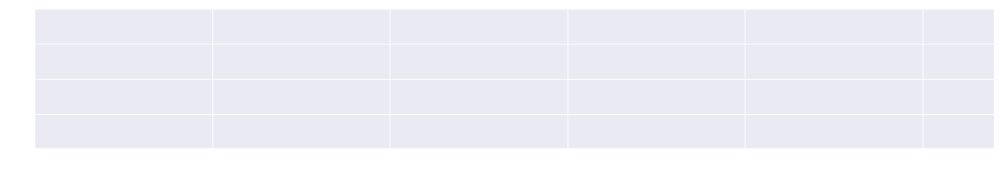

In [58]:
from matplotlib.patches import PathPatch
import matplotlib as mpl
import seaborn as sns
#Patch out and in by timeline

# anxiety_psy[1]
name = 'jinhee'
date = 'pilot'
df = anxiety_psy[1].copy(deep=True)
# df = df[df['Scene']=='Elevator']
timemax_out = df['Time'].max()
mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "white",
                     'xtick.color' : "white",
                     'ytick.color' : "white"})
# df=df_out
df['Time'] = df['Time']/30
x, y= df['Time'], df['marker']
timemax = df['Time'].max()

plt.figure(figsize=(20,3))
plt.ylim([1,5])
plt.xlim([0,timemax])
plt.xlabel('Time(sec)',fontsize=15, weight='bold')
plt.ylabel('Anxiety(1~5)',fontsize=15, weight='bold')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

ax = sns.lineplot(data=df, x='Time', y='marker', color='ghostwhite', alpha  = 0)
ax.grid(False)
# ax.set_xticks(np.arange(0,timemax,5.0))
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
poly = ax.fill_between(x, 0, y, color='none')
img = ax.imshow(y.array.reshape(1,-1), extent=[x[0], x.max(), 0, y.max()], cmap=cmap, aspect='auto', interpolation='bilinear')
clip_poly = PathPatch(poly.get_paths()[0], transform=ax.transData)
img.set_clip_path(clip_poly)
PCM=ax.get_children()[2]
# plt.colorbar(PCM, ax=ax, pad = 0.001)
plt.colorbar(ax.get_children()[2],ax=ax, pad = 0.001)


plt.tight_layout()
savename = name
# plt.savefig(f'D:/OneDrive/HubRoom/Projects/Social Distance/Writing/새 폴더/_{savename}.png', bbox_inches='tight', dpi=300, transparent=True)
# plt.savefig(f'D:/Users/Jiyoon/OneDrive/HubRoom/Projects/Social Distance/Writing/새 폴더/_{savename}.png'
#             , bbox_inches='tight', dpi=300, transparent=True)
maxa= df['marker'].max()
mina= df['marker'].min()



In [ ]:
bubble_out, bubble_in = [], []
bubble360_out, bubble360_in = [], []
for i in range(len(names)):
    playertransform_list_out = dl.playertransform(subj_pos_out[i], subj_rot_out[i])
    playertransform_list_in = dl.playertransform(subj_pos_in[i], subj_rot_in[i])
    for idx, _df in enumerate(playertransform_list_out):
        if _df['SubjectID_1_pos'][0] == _df['SubjectID_2_pos'][0]:
            del playertransform_list_out[idx]
    for idx, _df in enumerate(playertransform_list_in):
        if _df['SubjectID_1_pos'][0] == _df['SubjectID_2_pos'][0]:
            del playertransform_list_in[idx]
    df_bubble_out = dl.personalspace(playertransform_list_out, insight = True)
    df_bubble_in = dl.personalspace(playertransform_list_in, insight = True)
    df_bubble360_out = dl.personalspace(playertransform_list_out, insight = False)
    df_bubble360_in = dl.personalspace(playertransform_list_in, insight = False)
    bubble_out.append(df_bubble_out)
    bubble_in.append(df_bubble_in)
    bubble360_out.append(df_bubble360_out)
    bubble360_in.append(df_bubble360_in)
    

c:\Users\user\code\Social-Distance\Dataloader.py:585: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bubble['social space'][j] += 1
c:\Users\user\code\Social-Distance\Dataloader.py:587: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bubble['public space'][j] += 1
c:\Users\user\code\Social-Distance\Dataloader.py:583: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bubble['personal space'][j] += 1
c:\Users\user\code\Social-Distance\

In [ ]:
directory=f'./data/processed/Bubble_{date}'
directory360=f'./data/processed/Bubble360_{date}'

data2csv(bubble_out, names, filename='Bubble_out_',directory=directory)
data2csv(bubble_in, names, filename='Bubble_in_',directory=directory)
data2csv(bubble360_out, names, filename='Bubble360_out_',directory=directory360)
data2csv(bubble360_in, names, filename='Bubble360_in_',directory=directory360)

### Closest

In [ ]:
distv = defaultdict(dict)
for idx in range(len(names)):
    name = names[idx].split('_')[0]
    mask = 'off' if 'off' in names[idx] else 'on'
    pt_out = dl.playertransform(subj_pos_out[idx], subj_rot_out[idx])
    pt_in = dl.playertransform(subj_pos_in[idx], subj_rot_in[idx])
    w_out, w_in = dl.to_dataframe(pt_out), dl.to_dataframe(pt_in)
    distv[f'{mask}_out'][name] = w_out
    distv[f'{mask}_in'][name] = w_in

c:\Users\user\code\Social-Distance\Dataloader.py:424: RuntimeWarning: invalid value encountered in scalar divide
  return dot(A, B)/(norm(A)*norm(B))
c:\Users\user\code\Social-Distance\Dataloader.py:424: RuntimeWarning: invalid value encountered in scalar divide
  return dot(A, B)/(norm(A)*norm(B))
c:\Users\user\code\Social-Distance\Dataloader.py:424: RuntimeWarning: invalid value encountered in scalar divide
  return dot(A, B)/(norm(A)*norm(B))
c:\Users\user\code\Social-Distance\Dataloader.py:424: RuntimeWarning: invalid value encountered in scalar divide
  return dot(A, B)/(norm(A)*norm(B))
c:\Users\user\code\Social-Distance\Dataloader.py:424: RuntimeWarning: invalid value encountered in scalar divide
  return dot(A, B)/(norm(A)*norm(B))
c:\Users\user\code\Social-Distance\Dataloader.py:424: RuntimeWarning: invalid value encountered in scalar divide
  return dot(A, B)/(norm(A)*norm(B))
c:\Users\user\code\Social-Distance\Dataloader.py:424: RuntimeWarning: invalid value encountered in s

In [ ]:
distv_fps = defaultdict(dict)
for identifier, participant in distv.items():
        for name, w in participant.items():
            df = pd.DataFrame(columns=['Time','distance', 'visual_degree', 'agent'])
            for _df in w:
                if math.isnan(_df['visual_degree'][0]):
                    continue
                _df = _df.rename({'subject_ID': 'agent'}, axis=1)
                _df['Time'] = _df['Time'].apply(time2frame, textformet=False) 
                _df = _df.drop_duplicates(subset = ['Time'] , keep='first')
                _df = _df.set_index('Time')
                newindex = range(0,_df.index[-1]+1)
                _df = _df.reindex(newindex).fillna(method = 'ffill')
                _df.reset_index(inplace=True)
                _df = _df.rename({'index': 'Time'}, axis=1)
                df = pd.concat([df,_df], axis=0)
            df = df.reset_index(drop=True)
            distv_fps[identifier][name] = df




In [ ]:
save2pkl(distv_fps, f'./data/processed/distance_{date}.pkl')


## If all raw files are processed and saved as file, Just Start Here

In [ ]:
# datelist = os.listdir('data/raw/.')
datelist = os.listdir('data/raw/.')

distances = {}
for date in datelist:
    distances[date] = openpkl(f'./data/processed/distance_{date}.pkl')

save2pkl(distances, f'./data/processed/distances_all.pkl')

### To FPS

In [34]:
# datelist = os.listdir('data/raw/.')
datelist = os.listdir('data/raw/.')
#Bucket for data
coughings, anxieties, bubbles, bubble360s, transforms= {}, {}, {}, {}, {}
#Bucket for data to be processed as time -> fps
coughings_fps,anxieties_fps, bubbles_fps, bubble360s_fps, transforms_fps, length = {}, {}, {}, {}, {}, {}
# allocate files to proper bucket and deep copy them for the fps processing
intentions, cintentions = {}, {}
for item in datelist:
    date = item
    filenames_c = sorted(glob(f"data/cough/coughing_count_manual_{date}.xlsx"))
    filenames_i = sorted(glob(f"data/processed/Intentions_{date}/*.csv"))
    filenames_ic = sorted(glob(f"data/processed/Coughintentions_{date}/*.csv"))
    filenames_a = sorted(glob(f"data/processed/Anxiety_{date}/*.csv"))
    filenames_b = sorted(glob(f"data/processed/Bubble_{date}/*.csv"))
    filenames_b_360 = sorted(glob(f"data/processed/Bubble360_{date}/*.csv"))
    # filenames_t = f"data/processed/transform_{date}.pkl"
    filenames_t = f"data/processed/transform_{date}.pkl"
    

    # filenames = ['data/cough/' + n for n in os.listdir('data/cough')] #if directory issue occurs, use this code instead. 
    # Get data organized, return dict containing start-end coughing timepoint df and metadata 
    # of total time and goal reaching time
    coughings[date] = coughxlsx2df(filenames_c) 
    anxieties[date] = processed2df(filenames_a)
    bubbles[date] = processed2df(filenames_b)
    bubble360s[date] = processed2df(filenames_b_360)
    intentions[date] = processed2df(filenames_i)
    cintentions[date] = processed2df(filenames_ic)
    transforms[date] = openpkl(filenames_t)
    
    
    
    #To process fps indexed df. we need to keep coughing because we need start-end df too
    coughings_fps[date] = copy.deepcopy(coughings[date])
    anxieties_fps[date] = copy.deepcopy(anxieties[date]) 
    bubbles_fps[date] = copy.deepcopy(bubbles[date]) 
    bubble360s_fps[date] = copy.deepcopy(bubble360s[date])
    transforms_fps[date] = copy.deepcopy(transforms[date])
    

KeyboardInterrupt: 

In [4]:
pd.isnull(coughings['2204']['on_out']['jyh0104'][0]['Start_timepoint'][0])
# coughings['2204']['on_in']['jyh0104'][0]['Start_timepoint'][0]

False

### Coughing to fps

In [21]:
# create columns by coughing type
type2column = {
    "f": "Cough_Full",
    "s": "Cough_SoundOnly",
    "a": "Cough_ActionOnly"
}
for item in datelist: #by period of experiment
    date = item
    coughing = coughings[date]

    for identifier, participant in coughing.items():
        for name, (_df, m) in participant.items():
            if pd.isnull(_df['Start_timepoint'][0]): #if coughing is empty
                print(f'empty df is detected: {date}')
                frame_df = pd.DataFrame(columns = list(type2column.values()))
                

            else:
                            
                # to fps
                _df.loc[:, ["Start_frame"]] = _df.Start_timepoint.apply(time2frame)
                _df.loc[:, ["End_frame"]] = _df.End_timepoint.apply(time2frame)
                
                # Create new df with fps based index
                frame_df = pd.DataFrame({
                    v: [0] * (m["Total_video_length"] + 1) for v in type2column.values() #+1 because index start from 0
                })
                for row in _df.values:
                    _type, _, _, _start, _end = row
                    frame_df.loc[_start:_end, type2column[_type]] += 1
                
                
            coughings_fps[date][identifier][name] = frame_df 

C:\Users\user\AppData\Local\Temp\ipykernel_3740\3858926400.py:21: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  _df.loc[:, ["Start_frame"]] = _df.Start_timepoint.apply(time2frame)
C:\Users\user\AppData\Local\Temp\ipykernel_3740\3858926400.py:22: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  _df.loc[:, ["End_frame"]] = _df.End_timepoint.apply(time2frame)
C:\Users\user\AppData\Local\Temp\ipykernel_3740\3858926400.py:21: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new a

3866

### Anxiety and Bubble FPS

In [27]:
bubbles_dict = {}
bubbles_dict_360 = {}

for item in datelist:
    date = item
    anxiety = anxieties[date]
    bubble = bubbles[date]
    bubble_360 = bubble360s[date]
    #Anxiety to fps
    for identifier, participant in anxiety.items():
        for name, _df in participant.items():
            totallen = coughings[date][identifier][name][1]['Total_video_length']
            _df.reset_index(inplace=True)
            _df = _df[_df.columns.drop(list(_df.filter(regex='Subject')))]
            _df['Time'] = _df['Time'].apply(time2frame, textformet=False) 
            _df = _df.drop_duplicates(subset = ['Time'] , keep='first')
            _df = _df.set_index('Time')
            newindex = range(0,_df.index[-1]+1)
            _df = _df.reindex(newindex).fillna(method = 'ffill')
            _df = _df[:totallen+1]
            anxieties_fps[date][identifier][name] = _df 
    #Bubble to fps
    for identifier, participant in bubble.items():
        for name, _df in participant.items():
            totallen = coughings[date][identifier][name][1]['Total_video_length']
            _df = _df[_df.columns.drop(list(_df.filter(regex='Unnamed')))]
            _df['Time'] = _df['Time'].apply(time2frame, textformet=False) 
            _df = _df.set_index('Time')
            newindex = range(0,_df.index[-1]+1)
            _df = _df.reindex(newindex).fillna(method = 'ffill')
            _df = _df[:totallen+1]
            bubbles_fps[date][identifier][name] = _df 
    #This is no visual field limited data(360degree)
    for identifier, participant in bubble_360.items():
        for name, _df in participant.items():
            totallen = coughings[date][identifier][name][1]['Total_video_length']
            _df = _df[_df.columns.drop(list(_df.filter(regex='Unnamed')))]
            _df['Time'] = _df['Time'].apply(time2frame, textformet=False) 
            _df = _df.set_index('Time')
            newindex = range(0,_df.index[-1]+1)
            _df = _df.reindex(newindex).fillna(method = 'ffill')
            _df = _df[:totallen+1]
            bubble360s_fps[date][identifier][name] = _df 
      
#To start-end frame formet with distance(personal, social..) as a label
    bubble_dict = defaultdict(dict)
    bubble_dict_360 = defaultdict(dict)

    for identifier, participant in bubbles_fps[date].items():
        for name, _df in participant.items():
            bubble_dict[identifier][name] = bubbles2e(_df)
            bubble_dict[identifier][name] = bubble_dict[identifier][name].astype({"Start_Frame" : "int", "End_Frame" : "int"})
    bubbles_dict[date] = bubble_dict
    
    for identifier, participant in bubble360s_fps[date].items():
        for name, _df in participant.items():
            bubble_dict_360[identifier][name] = bubbles2e(_df)
            bubble_dict_360[identifier][name] = bubble_dict_360[identifier][name].astype({"Start_Frame" : "int", "End_Frame" : "int"})
    bubbles_dict_360[date] = bubble_dict_360

C:\Users\user\AppData\Local\Temp\ipykernel_3740\2800899843.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['Time'] = _df['Time'].apply(time2frame, textformet=False)
C:\Users\user\AppData\Local\Temp\ipykernel_3740\2800899843.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['Time'] = _df['Time'].apply(time2frame, textformet=False)
C:\Users\user\AppData\Local\Temp\ipykernel_3740\2800899843.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try us

### Animating Pathway -transforms to fps and add anxiety

In [30]:
for item in datelist:
    date = item    
    transform = transforms[date]
    transforms_fps[date] = copy.deepcopy(transforms[date])
    print(date)
    for identifier, participant in transform.items():
        for name, lst in participant.items():
            totallen = coughings[date][identifier][name][1]['Total_video_length']
            anxiety = anxieties_fps[date][identifier][name]
            _df = lst[-1]
            _df['Time'] = _df['Time'].apply(time2frame, textformet=False)
            _df = _df.set_index('Time')
            newindex = range(0,_df.index[-1]+1)
            _df = _df.reindex(newindex).fillna(method = 'ffill')
            _df = _df[:totallen+1] 
            _df = pd.merge(_df, anxiety, on='Time', how='left')
            transforms_fps[date][identifier][name] = _df
            

2108-2202
2204
2205
2209
2302


In [7]:
closest_m = pd.DataFrame()
closests = {}
for date, _dict in distances.items():
    temp = defaultdict(dict)
    for identifier, participant in _dict.items():
        spatial = 'out' if 'out' in identifier else 'in'
        mask = 'off' if 'off' in identifier else 'on'
        for name, _df in participant.items():
            anx = anxieties_fps[date][identifier][name]
            closest = distances[date][identifier][name].groupby(by='Time').min()
            closest = pd.concat([closest,anx], axis=1).dropna()
            closest = closest.rename({'agent':'name'})
            closest['name'], closest_m['name'] = name, name
            closest_m['distance'] = closest['distance'].mean()
            closest_m['Anxiety'] = closest['AnxietyLv'].mean()
            closest_m['mask'], closest_m['spatial'] = mask, spatial
            closest_m['date'] = date
            temp[identifier][name] = closest
    closests[date] = temp

save2pkl(closests, f'./data/processed/closests_all.pkl')

NameError: name 'distances' is not defined

In [31]:
save2pkl(transforms, './data/processed/transforms_all_overps.pkl')
save2pkl(transforms_fps, './data/processed/transforms_player_overps.pkl')

In [3]:
save2pkl(intentions, f'./data/processed/intentions_all.pkl')
save2pkl(cintentions, f'./data/processed/coughingintentions_all.pkl')


In [ ]:
transforms[date][identifier][name][0]

,Time,X_2_pos,Z_2_pos,Y_2_rot,case,distance,name,zone
0,18.2110,38.18064,-91.01686,85.78771,agent,3.018336,ysu9903,social
1,18.3223,38.14015,-91.04375,85.78771,agent,3.034094,ysu9903,social
2,18.4331,38.14015,-91.04375,85.78771,agent,3.037018,ysu9903,social
3,18.7654,38.14015,-91.04375,85.78771,agent,3.047070,ysu9903,social
4,19.0773,38.14015,-91.04375,85.78771,agent,3.062775,ysu9903,social
...,...,...,...,...,...,...,...,...
77,27.7847,38.74004,-90.82249,85.79963,agent,6.808734,ysu9903,public
78,27.8960,38.74004,-90.82249,85.79963,agent,6.972616,ysu9903,public
79,28.0067,38.74004,-90.82249,85.79963,agent,7.135111,ysu9903,public
80,28.1176,38.74004,-90.82249,85.79963,agent,7.297479,ysu9903,public


In [ ]:
date

'2302'

In [ ]:
integrates = defaultdict(dict)
integrates360 = defaultdict(dict)

for item in datelist:
    date = item
    integrated = defaultdict(dict)
    coughing_fps = coughings_fps[date]
    anxiety_fps = anxieties_fps[date]
    bubble_fps = bubbles_fps[date]
    bubble_fps_360 = bubble360s_fps[date]
    for identifier, participant in coughing_fps.items():
        for name, _df in participant.items():
            coughing_ = coughing_fps[identifier][name]
            anxiety_ = anxiety_fps[identifier][name]
            bubble_ = bubble_fps[identifier][name]
            
            _df = pd.concat([anxiety_,coughing_,bubble_], axis = 1).fillna(method = 'ffill')
            
            integrated[identifier][name] = _df
    integrates[date] = integrated

    integrated360 = defaultdict(dict)
    for identifier, participant in coughing_fps.items():
        for name, _df in participant.items():
            coughing_ = coughing_fps[identifier][name]
            anxiety_ = anxiety_fps[identifier][name]
            bubble_ = bubble_fps_360[identifier][name]
            
            _df = pd.concat([anxiety_,coughing_,bubble_], axis = 1).fillna(method = 'ffill')
            
            integrated360[identifier][name] = _df
    integrates360[date] = integrated360

### Goal

In [ ]:
goal_df = pd.DataFrame()
for identifier, participant in coughing.items():
    goal = []
    goal_val = []
    # Get list of dataframe in identifier

    #Get mask and place case from identifier
    spatial = 'out' if 'out' in identifier else 'in'
    mask = 'off' if 'off' in identifier else 'on'
    
    for name, _df in participant.items():
        goal_time = _df[1]['Goal_On sight']
        before = anxiety_fps[identifier][name][:goal_time]['AnxietyLv'].mean()
        after = anxiety_fps[identifier][name][goal_time:]['AnxietyLv'].mean()
        bf = {'Anxiety': before,'mask': mask,'spatial': spatial,'Case': 'before', 'name': name}
        af = {'Anxiety': after,'mask': mask,'spatial': spatial,'Case': 'after', 'name': name}
        total = pd.concat([pd.DataFrame(data = bf, index = [0]),pd.DataFrame(data = af, index = [0])], axis=0).reset_index(drop=True)
        goal_df = pd.concat([goal_df,total], axis=0).reset_index(drop=True)
        
        

    #Get Cuts of cases by cut functions
    # goal, goal_val = cut2single(coughing_temp,anxiety_temp,goal,goal_val,'Goal_On sight',interval=30)
    # # Create Goal Dataframe for analysis and plotting
    # for idx in range(len(goal)):
    #     name = goal[idx]['Subject']
    #     before = goal_val[idx][0]
    #     after = goal_val[idx][0]
    #     print(before, after)
    # # before = [i[0] for i in goal_val]
    # # after = [i[1] for i in goal_val]
    # # subject = goal['Subject']
    #     bf = {'Anxiety': before,'mask': mask,'spatial': spatial,'Case': 'before', 'name': name}
    #     af = {'Anxiety': after,'mask': mask,'spatial': spatial,'Case': 'after', 'name': name}
    #     total = pd.concat([pd.DataFrame(data = bf, index = [idx]),pd.DataFrame(data = af, index = [idx])], axis=0).reset_index(drop=True)
    #     goal_df = pd.concat([goal_df,total], axis=0).reset_index(drop=True)
        

In [ ]:
save2pkl(coughings_fps, './data/processed/coughings_fps_all.pkl')
save2pkl(anxieties_fps, './data/processed/anxieties_fps_all.pkl')
save2pkl(bubbles_fps, './data/processed/bubbles_fps_all.pkl')
save2pkl(bubble360s_fps, './data/processed/bubble360s_fps_all.pkl')
save2pkl(bubbles_dict, './data/processed/bubbles_dict_all.pkl')
save2pkl(bubbles_dict_360, './data/processed/bubbles_dict_360_all.pkl')
save2pkl(integrates, './data/processed/integrates_all.pkl')
save2pkl(integrates360, './data/processed/integrates360_all.pkl')
save2pkl(coughings, './data/processed/coughings_all.pkl')




### Transform

In [10]:
transforms = openpkl('./data/processed/transforms_all_overps.pkl')
transforms_player = openpkl('./data/processed/transforms_player_overps.pkl')

In [16]:
_transformp = pd.DataFrame()
_transforma = pd.DataFrame()
for date, dct in transforms.items():
    for identifier, participant in dct.items():
        for name, lst in participant.items():
            current_p = transforms_player[date][identifier][name].reset_index().copy(deep=True)
            current_a = pd.concat(transforms[date][identifier][name]).reset_index(drop=True)
            current_a = current_a[current_a['case']=='agent']
            
            current_p = current_p.drop(columns=['distance', 'Y_2_rot', 'zone'])
            current_a = current_a.drop(columns=['Y_2_rot'])
            spatial = identifier.split('_')[1]
            mask = identifier.split('_')[0]
            current_p['spatial'], current_p['mask'], current_p['date'] = spatial, mask, date
            current_a['spatial'], current_a['mask'], current_a['date'] = spatial, mask, date
            
            _transformp = pd.concat([_transformp, current_p],axis=0)
            _transforma = pd.concat([_transforma, current_a],axis=0)
            
_transformp = _transformp.reset_index(drop=True)
_transforma = _transforma.reset_index(drop=True)
lst = ['out', 'in']
t_range = {}
gap = 4 #8
for spatial in lst:
    df_all = _transformp[_transformp['spatial']==spatial]
    xmax, xmin = df_all['X_2_pos'].max(), df_all['X_2_pos'].min()
    zmax, zmin = df_all['Z_2_pos'].max(), df_all['Z_2_pos'].min()
    xrange, zrange = (xmax-xmin), (zmax-zmin)
    xintlist, zintlist = np.arange(xmin-1, xmax+0.1, gap, dtype=float), np.arange(zmin-1, zmax+0.1, gap, dtype=float) #To make the figure in same way, 
    xintlist[-1], zintlist[-1] = xmax+1, zmax+1
    t_range[spatial]=[xintlist, zintlist]
    xint, zint = (xrange/10), (zrange/10)
    print(f'X range:{xrange}, Z range:{zrange}')
    print(f'X interval:{xint}, Z interval:{zint}')
    print(max(xintlist),max(zintlist))
    print(min(xintlist),min(zintlist))
    print(len(xintlist),len(zintlist))


X range:81.019586, Z range:79.2672
X interval:8.1019586, Z interval:7.92672
72.07674 -14.83648
-10.942846 -96.10368
21 21
X range:88.35838000000001, Z range:53.55270000000001
X interval:8.835838, Z interval:5.355270000000001
49.5313 -39.40277
-40.82708 -94.95547
23 14


In [17]:
transforms_p_ = pd.DataFrame()
transforms_p = pd.DataFrame()

threshold = 6
for date, dct in transforms.items():
    for identifier, participant in dct.items():
        for name, lst in participant.items():
            spatial = identifier.split('_')[1]
            df = transforms_player[date][identifier][name].copy(deep=True)
            df['district']= ''
            xintlist = t_range[spatial][0]
            zintlist = t_range[spatial][1]
            for intx in range(len(xintlist)-1):
                for intz in range(len(zintlist)-1):
                    bx, ax = xintlist[intx], xintlist[intx+1]
                    bz, az = zintlist[intz], zintlist[intz+1]
                    df.loc[(df['X_2_pos']>=bx)&(df['X_2_pos']<ax)&(df['Z_2_pos']>=bz)&(df['Z_2_pos']<az),'district'] = f'{intx}_{intz}'
            anx_df = df[['AnxietyLv', 'district']].reset_index(drop=True).groupby(['district']).mean().reset_index()
            anx_df['name'], anx_df['spatial'] = name, spatial
            transforms_p_ = pd.concat([transforms_p_, anx_df])
transforms_p_ = transforms_p_.reset_index(drop=True)  
df_c = transforms_p_.groupby(['district','spatial']).count().reset_index() 
transforms_p_ = transforms_p_[~transforms_p_['district'].isin(list(df_c[df_c['name']<threshold]['district']))].reset_index(drop=True)  
transforms_p = transforms_p_.groupby(['district','spatial']).mean().reset_index() 


In [18]:
lst = transforms[date][identifier][name]
transforms_a_ = pd.DataFrame()
transforms_a = pd.DataFrame()

threshold_d = 7.6
df_ta = pd.DataFrame()
for date, dct in transforms.items():
    for identifier, participant in dct.items():
        for name, lst in participant.items():
            spatial = identifier.split('_')[1]
            xintlist = t_range[spatial][0]
            zintlist = t_range[spatial][1]
            for idx in range(len(lst)):
                df = transforms[date][identifier][name][idx].copy(deep=True)
                if df['case'][0] !='participant':
                    df['district']= ''
                    for intx in range(len(xintlist)-1):
                        for intz in range(len(zintlist)-1):
                            bx, ax = xintlist[intx], xintlist[intx+1]
                            bz, az = zintlist[intz], zintlist[intz+1]
                            df.loc[(df['X_2_pos']>=bx)&(df['X_2_pos']<ax)&(df['Z_2_pos']>=bz)&(df['Z_2_pos']<az),'district'] = f'{intx}_{intz}'
                    df = df[df['distance']<threshold_d].reset_index(drop=True)
                    _df = df[['Time','distance', 'district']]
                    _df['index'] = idx
                    _df['Time'] = _df['Time'].apply(math.floor)
                    _df = _df.groupby(['Time','district','index']).mean().reset_index()
                    _df['name'], _df['spatial'] = name, spatial
                    df_ta = pd.concat([df_ta,_df], axis=0).reset_index(drop=True)
            df_ta = df_ta.sort_values(by=['Time']).reset_index(drop=True)
            df_all = df_ta.groupby(['district','Time','index','spatial','name']).count().sort_values(by='Time').reset_index()
            df_all = df_all.groupby(['district','Time','spatial','name']).count().sort_values(by='Time').reset_index()
            df_d = df_ta.groupby(['district','Time','index','spatial','name']).mean().sort_values(by='Time').reset_index()
            df_d = df_d.groupby(['district','Time','spatial','name']).mean().sort_values(by='Time').reset_index()
            df_all['distance'] = df_d['distance']
            df_all =  df_all.rename(columns={'index': 'count'})
            transforms_a_ = pd.concat([transforms_a_, df_all])

transforms_a_ = transforms_a_.reset_index(drop=True)  
transforms_a_ = transforms_a_.reset_index(drop=True)  
cnt = transforms_a_.groupby(['district','Time','spatial']).count().reset_index()
dst = transforms_a_.groupby(['district','Time','spatial']).mean().reset_index()
cnt['distance'], cnt['count'] = dst['distance'], dst['count']
cnt = cnt[~cnt['district'].isin(list(cnt[cnt['name']<threshold]['district']))].reset_index(drop=True) 
transforms_a = cnt.groupby(['district','spatial']).mean().reset_index()


C:\Users\Jiyoon\AppData\Local\Temp/ipykernel_16972/2444021299.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['index'] = idx
C:\Users\Jiyoon\AppData\Local\Temp/ipykernel_16972/2444021299.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['Time'] = _df['Time'].apply(math.floor)


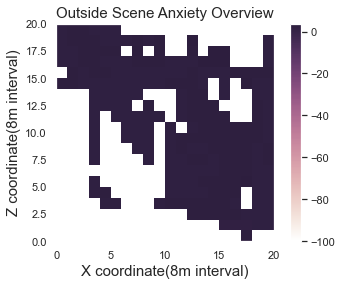

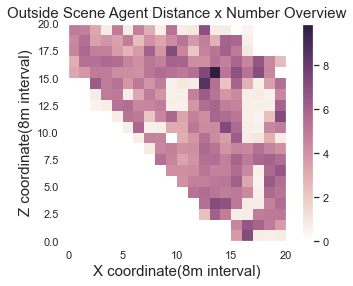

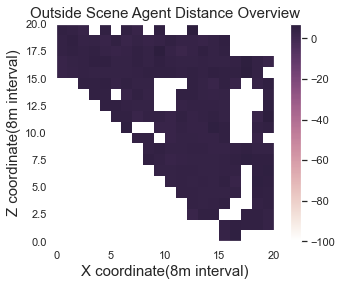

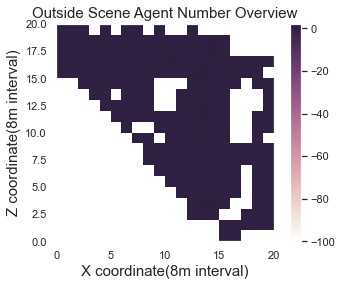

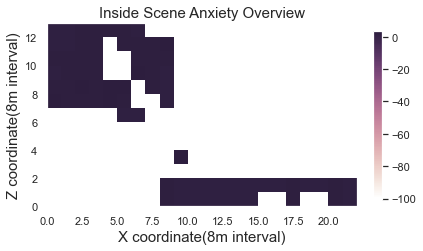

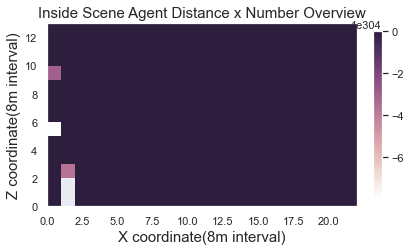

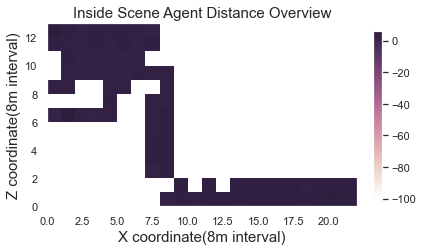

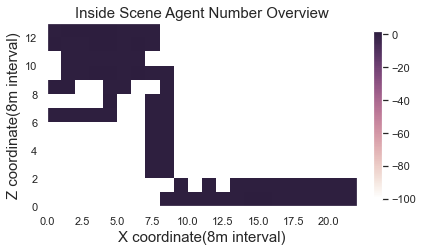

In [24]:
lst = ['out', 'in']
gridanx = []
gridagentd = []
gridagentn = []
gridweighted = []

for spatial in lst:
    xintlist = t_range[spatial][0]
    zintlist = t_range[spatial][1]
    df = transforms_p[transforms_p['spatial']==spatial].reset_index(drop=True)
    df_a = transforms_a[transforms_a['spatial']==spatial].reset_index(drop=True)
    maxd = max(df_a['distance'])
    mind = min(df_a['distance'])
    df_a['distance'] = (df_a['distance']-(maxd+mind)).abs()
    #Fromzero
    # anxarr = np.zeros((len(xintlist)-1,len(zintlist)-1))
    # distarr = np.zeros((len(xintlist)-1,len(zintlist)-1))
    # numarr = np.zeros((len(xintlist)-1,len(zintlist)-1))
    
    anxarr = np.empty((len(xintlist)-1,len(zintlist)-1))
    distarr = np.empty((len(xintlist)-1,len(zintlist)-1))
    numarr = np.empty((len(xintlist)-1,len(zintlist)-1))
    warr = np.empty((len(xintlist)-1,len(zintlist)-1))
    
    # #Scaled
    # anxarr.fill(min(df['AnxietyLv']))
    # distarr.fill(min(df_a['distance']))
    # numarr.fill(min(df_a['count']))
    # warr.fill(min(df_a['count'])*min(df_a['distance']))
    
    
    # Empty check
    checknum =-1
    anxarr.fill(checknum)
    distarr.fill(checknum)
    numarr.fill(checknum)    

    
    for idx in range(len(df)):
        x = int(df['district'][idx].split('_')[0])
        z = int(df['district'][idx].split('_')[1]) 
        anxiety = df['AnxietyLv'][idx]
        anxarr[x,z] = anxiety
    for idx in range(len(df_a)):
        x = int(df_a['district'][idx].split('_')[0])
        z = int(df_a['district'][idx].split('_')[1]) 
        distance = df_a['distance'][idx]
        count = df_a['count'][idx]
        weighted = distance*count
        distarr[x,z] = distance
        numarr[x,z] = count
        warr[x,z] = weighted
        
        

    gridanx.append(anxarr)
    gridagentd.append(distarr)
    gridagentn.append(numarr)
    gridweighted.append(warr)
lst=['Outside','Inside']

arrs = [gridanx, gridweighted, gridagentd, gridagentn]
arrn = ['Anxiety', 'Agent Distance x Number','Agent Distance', 'Agent Number']
condition = 'emptycheck_without limitation_20'
for sidx in range(len(lst)):
    for idx in range(len(arrs)):
        item = arrs[idx]
        arrname = arrn[idx]
        spatial = lst[sidx]
        fig, ax = plt.subplots(1)
        name = f'{spatial} Scene {arrname} Overview'
        cmap = sns.cubehelix_palette(light=1, as_cmap=True)
        ax.set_title(name, fontsize=15)
        ax.set_xlabel('X coordinate(8m interval)', fontsize=15)
        ax.set_ylabel('Z coordinate(8m interval)', fontsize=15)
        savename = name + condition
        p = ax.pcolormesh(np.transpose(item[sidx]), alpha=1, cmap=cmap)
        plt.gca().set_aspect("equal")
        if spatial =='Inside':
            fig.colorbar(p, fraction=0.025)
        else:
            fig.colorbar(p)
        
        plt.savefig(f'graphs/overleaf/{savename}.png', bbox_inches='tight')
        plt.show()


    
    



In [20]:
save2pkl(transforms_p, './data/processed/transforms_p_20_withoutlim.pkl')
save2pkl(transforms_a, './data/processed/transforms_a_20_withoutlim.pkl')